# Camera calibration

In [1]:
%matplotlib inline
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from moviepy.editor import VideoFileClip


# Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
num_cor_x, num_cor_y = 9, 6
objp = np.zeros((num_cor_x*num_cor_y, 3), np.float32)
objp[:,:2] = np.mgrid[0:num_cor_x, 0:num_cor_y].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = sorted(glob.glob('camera_cal/calibration*.jpg'))

n_images_wo_found_corners = 0

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(
        gray,
        (num_cor_x, num_cor_y),
        None
    )

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
    else:
        n_images_wo_found_corners += 1
        print('Didn`t find corners in image: "{}"'.format(fname))

Didn`t find corners in image: "camera_cal/calibration1.jpg"
Didn`t find corners in image: "camera_cal/calibration4.jpg"
Didn`t find corners in image: "camera_cal/calibration5.jpg"


## Undistortion of one of the images (`calibration1.jpg`, for which corners weren't found)

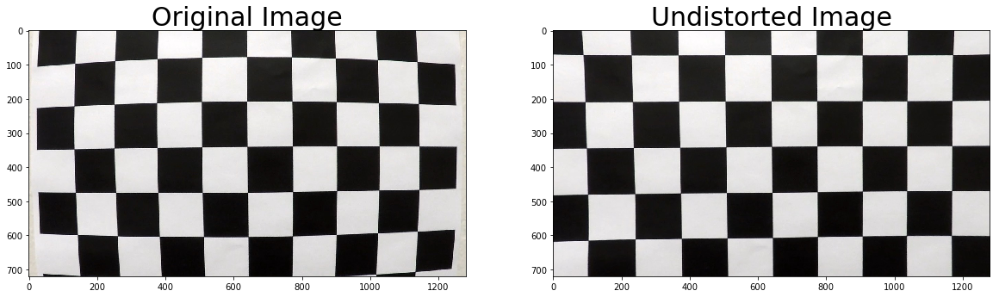

In [2]:
# Test undistortion on an image
img = plt.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
    objpoints,
    imgpoints,
    img_size,
    None,
    None
)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/undistorted1.jpg', dst)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30);
plt.savefig('output_images/undistort.jpg')

## Undistortion for one image in `test_images/` 

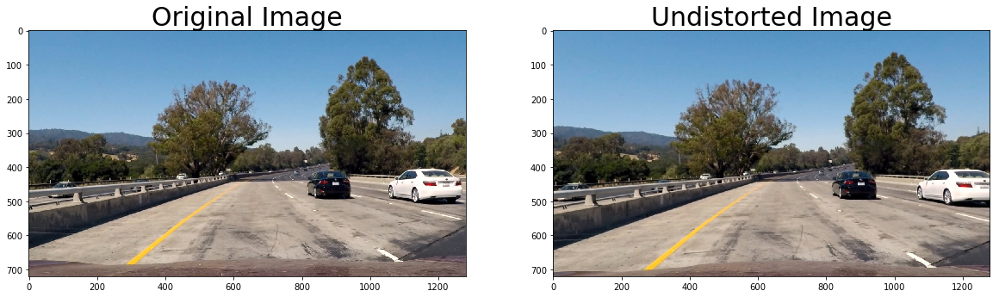

In [3]:
# Test undistortion on an image
img = plt.imread('test_images/test1.jpg')
height, width, _ = img.shape

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
    objpoints,
    imgpoints,
    (height, width),
    None,
    None
)


undist = cv2.undistort(img, mtx, dist, None, mtx)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30);

plt.savefig('output_images/undistort_test1.jpg')

# Now, for the binary representation of the image that will allow for line identification

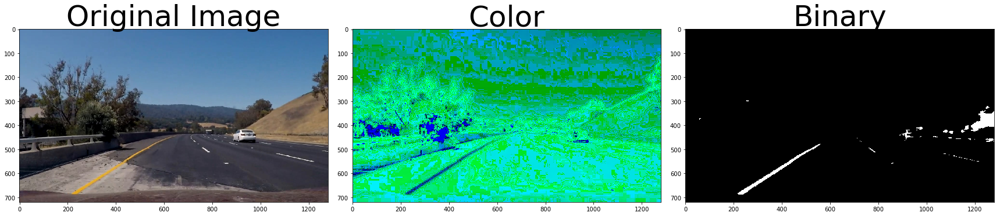

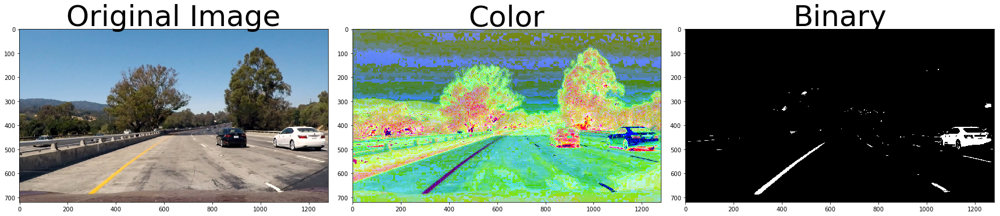

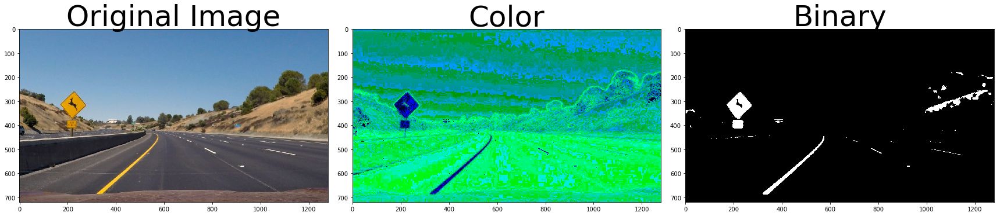

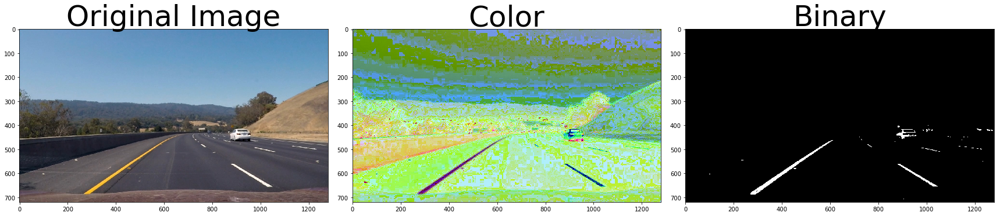

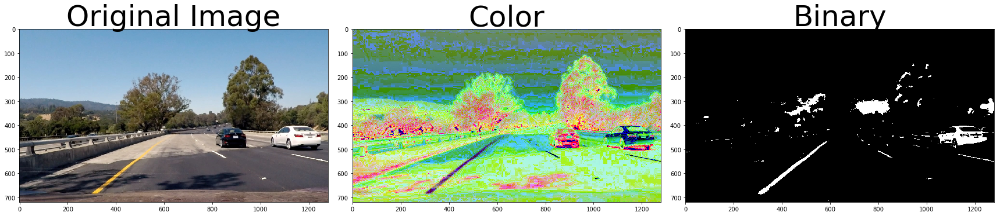

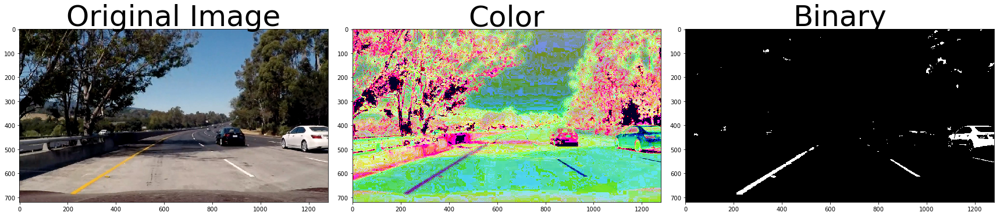

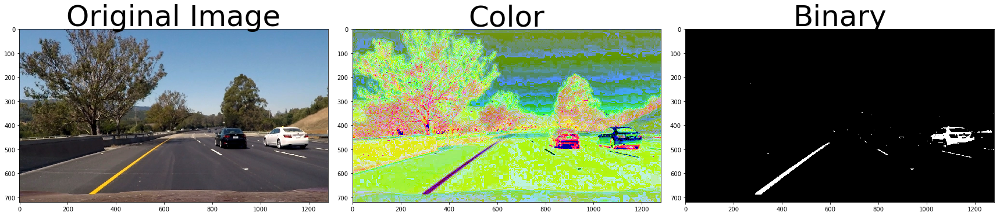

In [4]:
from functools import reduce


def pipeline(img,
             r_thresh=(90, 255),
             l_thresh=(210, 255),
             s_thresh=(190, 255),
             b_thresh=(190, 255)):
    
    img = np.copy(img)
    
    r_channel = img[:, :, 0]
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:, :, 1]
    l_channel = l_channel*(255/np.max(l_channel))
    s_channel = hls[:, :, 2]
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    b_channel = lab[:, :, 2]
    b_channel = b_channel*(255/np.max(b_channel))
    
    color = np.dstack((l_channel, s_channel, b_channel))
    
    r_bin = (r_channel > r_thresh[0]) & (r_channel <= r_thresh[1])
    l_bin = (l_channel > l_thresh[0]) & (l_channel <= l_thresh[1])
    s_bin = (s_channel > s_thresh[0]) & (s_channel <= s_thresh[1])
    b_bin = (b_channel > b_thresh[0]) & (b_channel <= b_thresh[1])
    taken_into_account = [
#         r_bin,
        l_bin,
#         s_bin,
        b_bin,
    ]
    
    output = reduce(lambda x,y: x | y, taken_into_account).astype(np.uint8)
    return color, output
     
    

for file_num in range(7):
    filename = 'test_images/test{}.jpg'.format(file_num)
    img = plt.imread(filename)
    color, binary = pipeline(img)

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(color)
    ax2.set_title('Color', fontsize=50)
    ax3.imshow(binary, cmap='gray')
    ax3.set_title('Binary', fontsize=50);
    
    plt.savefig('output_images/binary_tripple_{}.jpg'.format(file_num))

# Bird's eye view

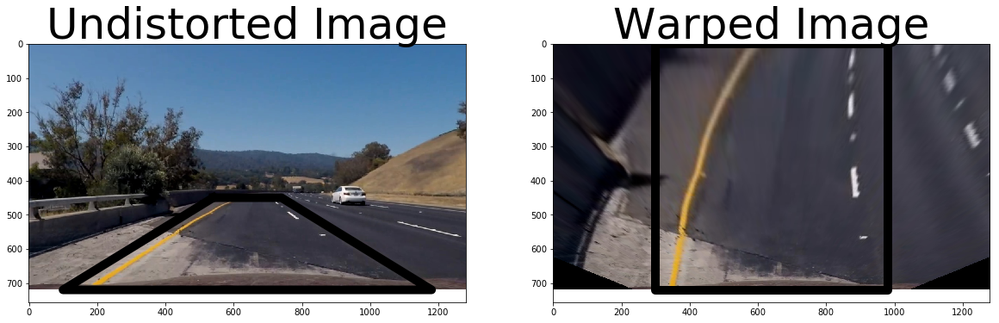

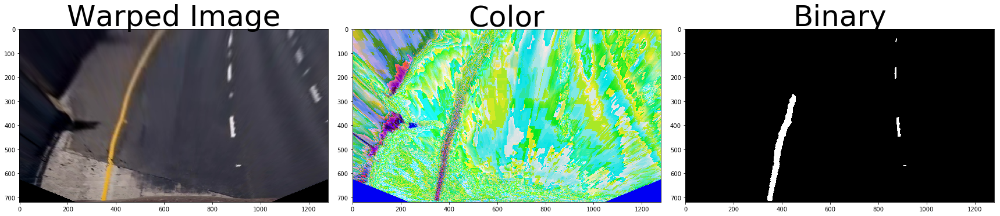

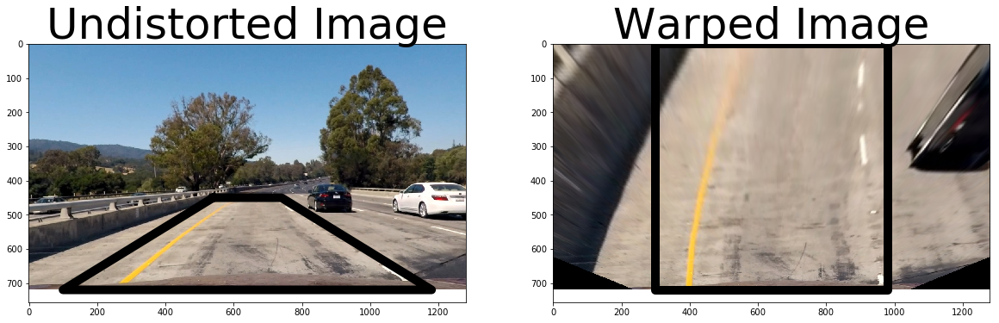

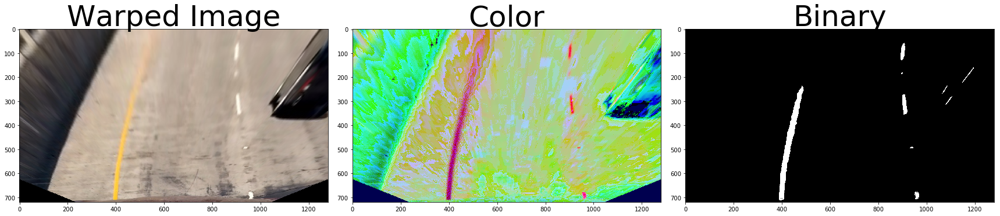

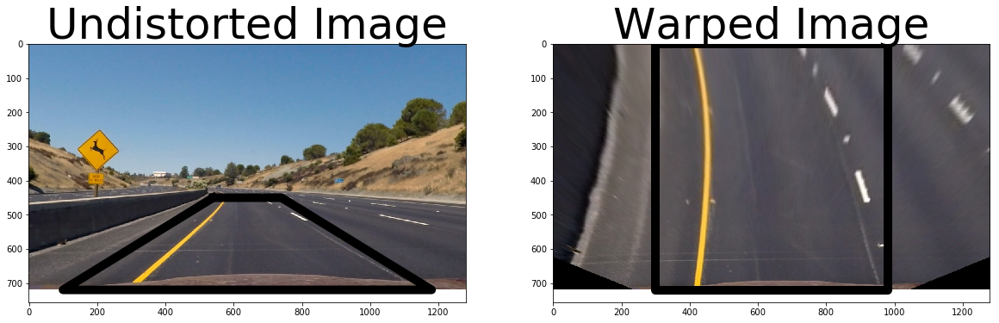

...

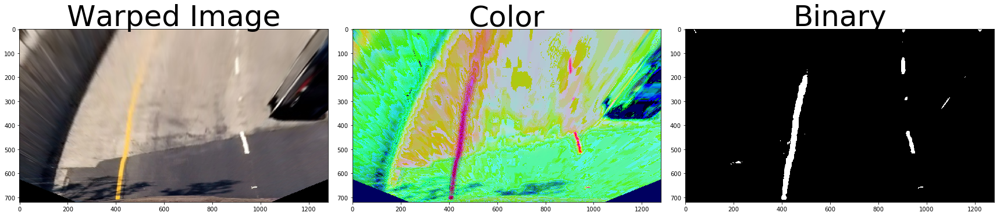

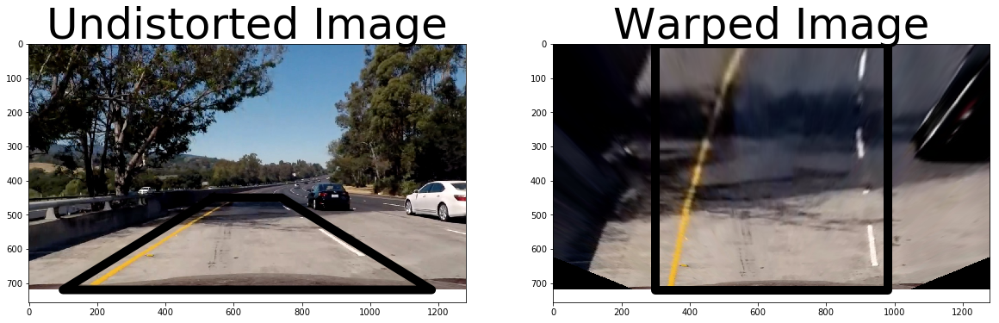

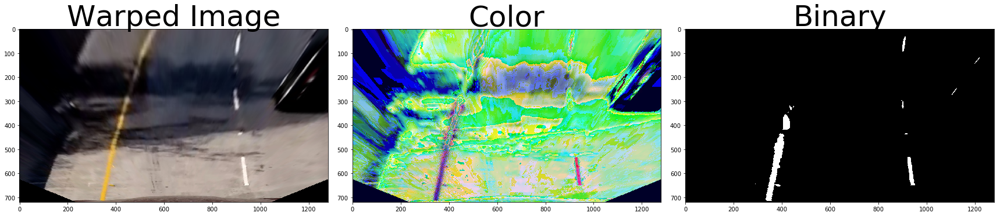

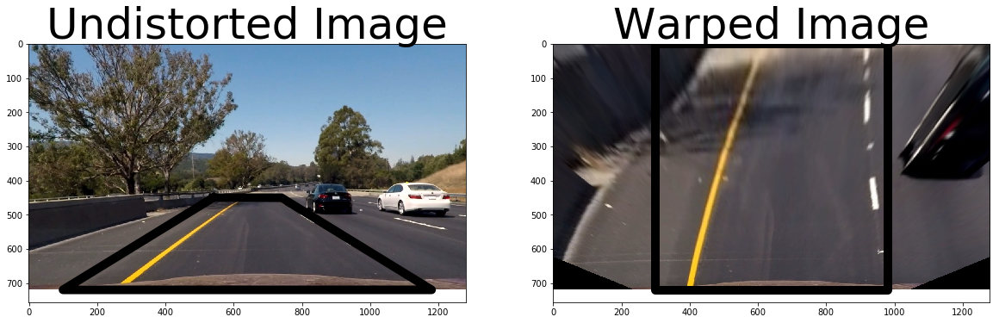

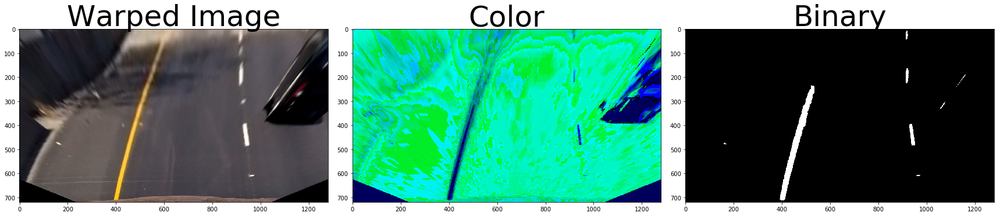

In [5]:
SRC = np.float32([
    (540, 450),
    (740, 450), 
    (100, 720), 
    (1180, 720),
])

DST = np.float32([
    (300, 0),
    (width-300, 0),
    (300, height),
    (width-300, height),
])


def warp(img, mtx, dist):
    global DST, SRC
    global height, width
    
    M = cv2.getPerspectiveTransform(SRC, DST)
    Minv = cv2.getPerspectiveTransform(DST, SRC)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    warped = cv2.warpPerspective(
        undist,
        M,
        (width, height),
        flags=cv2.INTER_LINEAR
    )
    
    return undist, warped, Minv
    
    
for file_num in range(7):
    filename = 'test_images/test{}.jpg'.format(file_num)
    img = plt.imread(filename)
    undist, warped, Minv = warp(img, mtx, dist)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))

    ax1.imshow(undist)
    ax1.set_title('Undistorted Image', fontsize=50)
    x = [SRC[i][0] for i in [0, 2, 3, 1, 0]]
    y = [SRC[i][1] for i in [0, 2, 3, 1, 0]]
    ax1.plot(x, y, color='black', linewidth=10)

    ax2.imshow(warped)
    ax2.set_title('Warped Image', fontsize=50)
    x = [DST[i][0] for i in [0, 2, 3, 1, 0]]
    y = [DST[i][1] for i in [0, 2, 3, 1, 0]]
    ax2.plot(x, y, color='black', linewidth=10);
    plt.savefig('output_images/warped_{}.jpg'.format(file_num))
    
    color, binary_warped = pipeline(warped)

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(warped)
    ax1.set_title('Warped Image', fontsize=50)

    ax2.imshow(color)
    ax2.set_title('Color', fontsize=50)

    ax3.imshow(binary_warped, cmap='gray')
    ax3.set_title('Binary', fontsize=50);
    
    plt.savefig('output_images/warped_tripple_{}.jpg'.format(file_num))

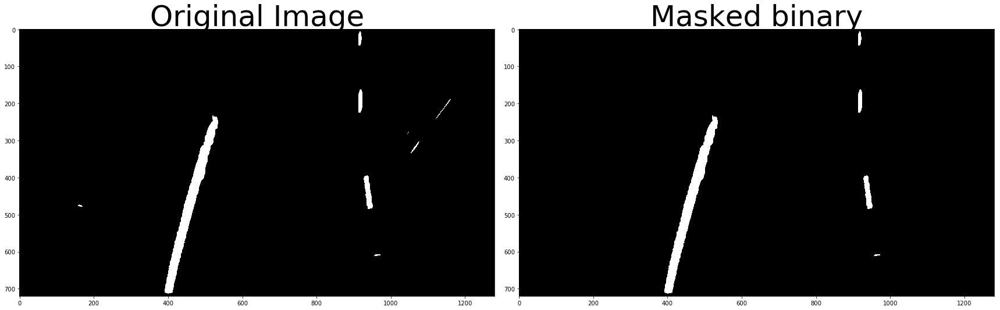

In [6]:
def mask_margins(binary_warped):
    global DST
    
    masked = np.copy(binary_warped)   
    min_, max_ = DST[:, 0].min(), DST[:, 0].max()
    min_, max_ = map(int, [min_, max_])
    masked[:, :min_] = 0
    masked[:, max_:] = 0
    return masked


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(binary_warped, cmap='gray')
ax1.set_title('Original Image', fontsize=50)

binary_warped = mask_margins(binary_warped)

ax2.imshow(binary_warped, cmap='gray')
ax2.set_title('Masked binary', fontsize=50);

## Sliding window (line finding)
#### You should think about how you could improve this implementation to make sure you can find the lines as robustly as possible!

In [7]:
def find_lines(binary_warped):
    # Assuming you have created 
    # a warped binary image called "binary_warped"
    # take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:, :], axis=0)

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9

    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 100

    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        cv2.rectangle(
            out_img,
            (win_xleft_low,win_y_low),
            (win_xleft_high,win_y_high),
            (0,255,0),
            2
        ) 
        cv2.rectangle(
            out_img,
            (win_xright_low,win_y_low),
            (win_xright_high,win_y_high),
            (0,255,0),
            2
        ) 

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = (
            (nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)
        ).nonzero()[0]
        good_right_inds = (
            (nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)
        ).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    return left_fit, right_fit, left_lane_inds, right_lane_inds


left_fit, right_fit, left_lane_inds, right_lane_inds = find_lines(binary_warped)

## Skip the sliding windows step once you know where the lines are

In [8]:
def polyfit_with_prev(binary_warped, left_fit, right_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    try:
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
    except TypeError as e:
        left_fit, right_fit = None, None
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds


left_fit, right_fit, left_lane_inds, right_lane_inds = polyfit_with_prev(
    binary_warped,
    left_fit,
    right_fit
)

nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])

leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

### Let's visualize the result here as well

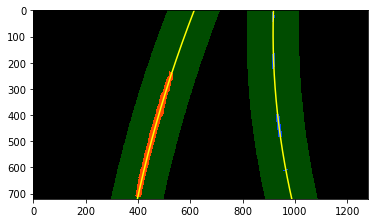

In [9]:
# Create an image to draw on and an image to show the selection window
binary_warped = mask_margins(binary_warped)
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)

# Get nonzero-s
nonzeroy, nonzerox = map(np.array, binary_warped.nonzero())

# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
margin = 100
left_line_window1 = np.array([
    np.transpose(np.vstack([left_fitx-margin, ploty]))
])
left_line_window2 = np.array([
    np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))
])
left_line_pts = np.hstack((left_line_window1, left_line_window2))

right_line_window1 = np.array([
    np.transpose(np.vstack([right_fitx-margin, ploty]))
])
right_line_window2 = np.array([
    np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))
])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0);

plt.savefig('output_images/polyfit.jpg')

# Drawing the lane

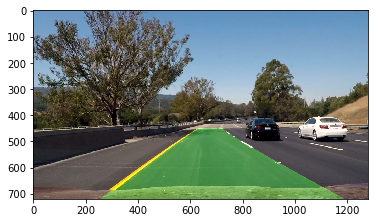

In [10]:
def draw_lane(img, binary_warped, left_fitx, right_fitx, ploty, Minv):
    global width, height
    img = np.copy(img)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    unwarped = cv2.warpPerspective(color_warp, Minv, (width, height))
    
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, unwarped, 0.3, 0)
    
    return result


unwarped = draw_lane(img, binary_warped, left_fitx, right_fitx, ploty, Minv)
plt.imshow(unwarped);

# Before putting it all together, let's run the functions defined above

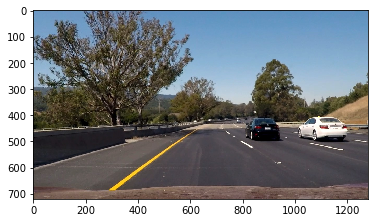

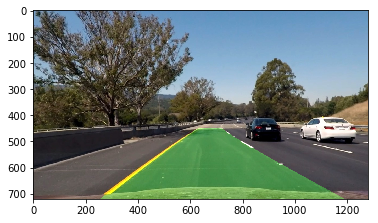

In [11]:
plt.imshow(img)
plt.savefig('output_images/lane_not_selected.jpg')
plt.show()

undist, warped, Minv = warp(img, mtx, dist)

color, binary_warped = pipeline(warped)

binary_warped = mask_margins(binary_warped)

left_fit, right_fit, left_lane_inds, right_lane_inds = find_lines(binary_warped)

ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

unwarped = draw_lane(undist, binary_warped, left_fitx, right_fitx, ploty, Minv)
plt.imshow(unwarped);
plt.savefig('output_images/lane_selected.jpg')

# One more thing: let's use the following `Line` class for storing fitted lines

In [12]:
class Line():
    def __init__(self):
        # Was the line detected in the last iteration?
        self.detected = False  
        
        # For calculating mean fit
        self.recent_fits = []
        
        # Polynomial coefficients for the most recent fit
        self.current_fit = None
        
    def update_fit(self, new_fit):
        if new_fit is None:
            return
        
        diffs = [0,0,0]
        if self.current_fit is not None:
            diffs = np.abs(new_fit - self.current_fit)
            
        if (diffs[0] < 0.001) and (diffs[1] < 1) and (diffs[2] < 100):
            self.detected = True
            self.current_fit = new_fit
            self.recent_fits.append(new_fit)
            self.recent_fits = self.recent_fits[-3:]
        else:
            self.detected = False
            print(diffs)
        
    def get_current_fit(self):
        return self.current_fit
    
    def get_mean_fit(self):
        return np.mean(self.recent_fits, axis=0)

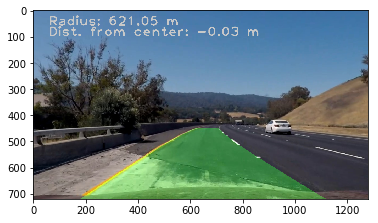

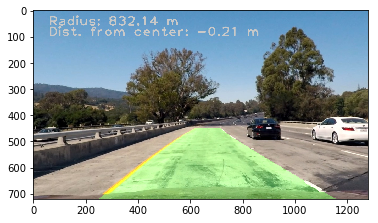

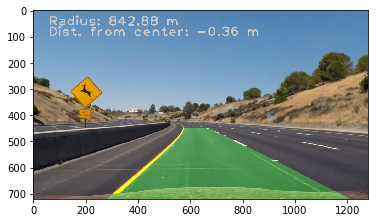

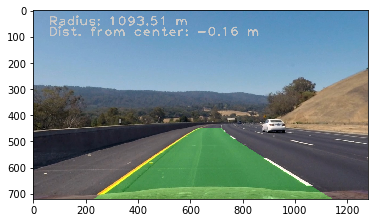

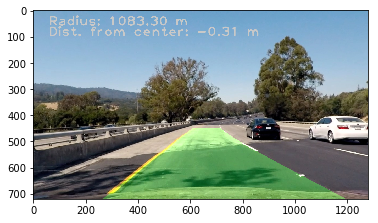

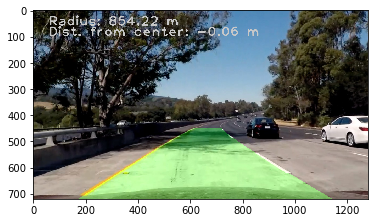

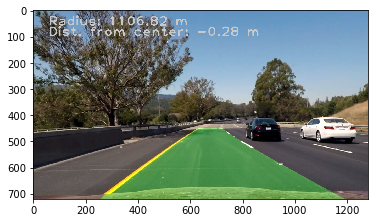

In [ ]:
def update_both_lines(left_line, right_line, left_fit, right_fit):
    if left_fit is not None and right_fit is not None:
        left_line.update_fit(left_fit)
        right_line.update_fit(right_fit)
    else:
        left_line.detected = False
        right_line.detected = False

        
def process_image(img, key_frame_interval=200, cache_length=10):
    # Globals for warping the image
    global mtx, dist
    
    # Globals for keeping the line
    global left_line, right_line
    
    undist, warped, Minv = warp(img, mtx, dist)
    
    color, binary_warped = pipeline(warped)
    masked_binary = mask_margins(binary_warped)
    binary_warped = masked_binary

    if not left_line.detected and not right_line.detected:
        try:
            left_fit, right_fit, left_lane_inds, right_lane_inds = find_lines(binary_warped)
        except TypeError as e:
            plt.imsave('wtf.png', img)
            raise
    else:
        left_fit = left_line.get_mean_fit()
        right_fit = right_line.get_mean_fit()
        left_fit, right_fit, left_lane_inds, right_lane_inds = polyfit_with_prev(
            binary_warped,
            left_fit,
            right_fit
        )
    
    if left_fit is not None and right_fit is not None:
        update_both_lines(left_line, right_line, left_fit, right_fit)
    else:
        left_line.detected = False
        right_line.detected = False
        
    left_fit = left_line.get_mean_fit()
    right_fit = right_line.get_mean_fit()
        
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    y_eval = np.max(ploty)
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    fit_cr = 0.5 * (left_fit_cr + right_fit_cr)
    
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    curve = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    car_position = binary_warped.shape[1] / 2
    left_x = left_fit[0]*height**2 + left_fit[1]*height + left_fit[2]
    right_x = right_fit[0]*height**2 + right_fit[1]*height + right_fit[2]
    lane_center = 0.5 * (right_x + left_x)
    center_disp = (car_position - lane_center) * xm_per_pix
    
    unwarped = draw_lane(undist, binary_warped, left_fitx, right_fitx, ploty, Minv)
    font = cv2.FONT_HERSHEY_PLAIN
    text = 'Radius: {:.2f} m'.format(curve)
    cv2.putText(unwarped, text, (60, 60), font, 3.5, (200, 200, 200), 3, cv2.LINE_AA)
    text = 'Dist. from center: {:.2f} m'.format(center_disp)
    cv2.putText(unwarped, text, (60, 100), font, 3.5, (200, 200, 200), 3, cv2.LINE_AA)

    return unwarped


for file_num in range(7):
    filename = 'test_images/test{}.jpg'.format(file_num)
    img = plt.imread(filename)
    left_line = Line()
    right_line = Line()
    unwarped = process_image(img)
    plt.imshow(unwarped)
    plt.savefig('output_images/lane_selected_with_radius_{}.jpg'.format(file_num))
    plt.show()
    


In [ ]:
vid_output = 'project_video_out.mp4'
clip = VideoFileClip('project_video.mp4')

left_line = Line()
right_line = Line()

vid_clip = clip.fl_image(process_image)
vid_clip.write_videofile(vid_output, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


 16%|█▌        | 196/1261 [00:30<02:43,  6.52it/s]

limit_output extension: Maximum message size of 10000 exceeded with 10027 characters